## Installing uv

To start, you'll want to have uv installed:

https://docs.astral.sh/uv/getting-started/installation/


**Next, run this in the terminal, from the parent directory:**

    uv sync


Now you will have the kernel used to run this notebook

---

## Running the Required Servers

You need to run **three servers**, each in its own terminal:

- `central_server.py`
- `AS_server_AtomBlastTwin.py`
- `Ceos_server_twin.py`

### 1. Activate the Virtual Environment

`uv` should have created a `.venv` directory for you.

**On macOS / Linux:**

    source .venv/bin/activate

**On Windows (likely):**

    source .venv/Scripts/activate

You should now see the environment activated.

---

### 2. Start the Servers

**Terminal 1 — Central Server**

    source .venv/bin/activate
    python -m asyncroscopy.servers.protocols.central_server

**Terminal 2 — Atom Resolution Simulation Server**

    source .venv/bin/activate
    python -m asyncroscopy.servers.AS_server_AtomBlastTwin

**Terminal 3 — CEOS Twin Server**

    source .venv/bin/activate
    python -m asyncroscopy.servers.Ceos_server_twin

---

You're now ready to run this notebook! 🚀

In [1]:
import sys
import ast
import numpy as np
sys.path.insert(0, '../')
from asyncroscopy.clients.notebook_client import NotebookClient
from asyncroscopy.utils import parula_color_map
import matplotlib.pyplot as plt
import time

from skimage.feature import blob_log
from scipy.ndimage import gaussian_filter

import pyTEMlib
from pyTEMlib import probe_tools as pt
from pyTEMlib.atom_tools import atom_refine
%matplotlib ipympl

### Connections:

In [2]:
# Connect the Client to the central (async) server
tem = NotebookClient.connect(host='localhost',port=9000)

# Tell the central server address of all connected instruments
routing_table= {"AS": ("localhost", 9001),
                "Gatan": ("localhost", 9002),
                "Ceos": ("localhost", 9003),
                "Preacquired_AS": ("localhost", 9004)}
tem.send_command('Central',"set_routing_table", routing_table)

# ConnectionResetError: [Errno 54] Connection reset by peer 
# in terminal, type:
# lsof -i :9000
# then kill PIDs on that port


Connecting to central server localhost:9000...
Connected to central server.


'[Central] Routing table updated'

In [3]:
# connect to the AutoScript computer and initialize microscope
# tem.send_command('AS',command='connect_AS',args={'host':'localhost','port':9001})

tem.send_command('AS',command='connect_AS',args={'host':'10.46.217.241','port':9095})


'[AS] Connected to microscope.'

In [4]:
tem.send_command('AS', 'calibrate_screen_current')

'[AS] calibrated screen current'

In [5]:
tem.send_command('AS', 'set_current', {'current':50})
time.sleep(2)

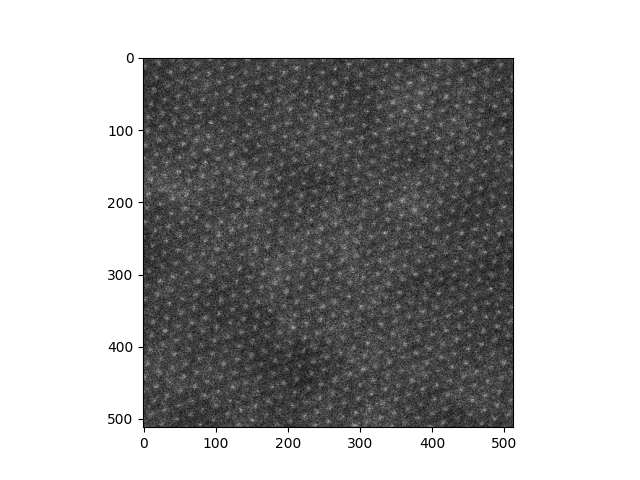

In [54]:
image_args = {'scanning_detector':'HAADF',
                'size':512,
                'dwell_time':10e-6}


img = tem.send_command('AS','get_scanned_image', image_args)

plt.figure()
plt.imshow(img, cmap="gray")

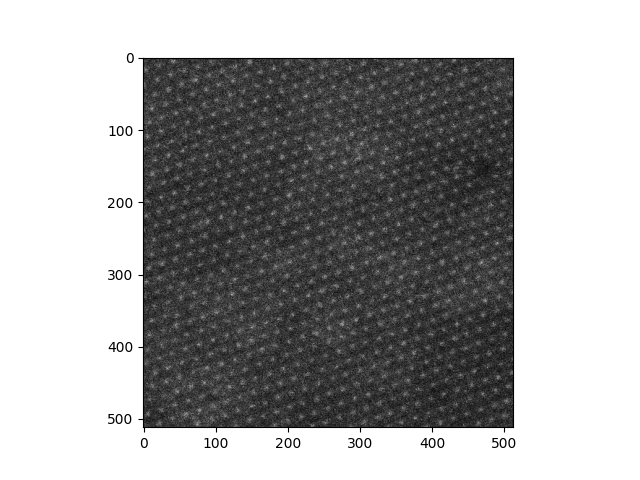

In [5]:
image_args = {'scanning_detector':'HAADF',
                'size':512,
                'dwell_time':10e-6}

tem.send_command('AS', 'set_beam_current', {'current':50}) # pA
img = tem.send_command('AS','get_scanned_image', image_args)
tem.send_command('AS','blank_beam')

plt.figure()
plt.imshow(img, cmap="gray")


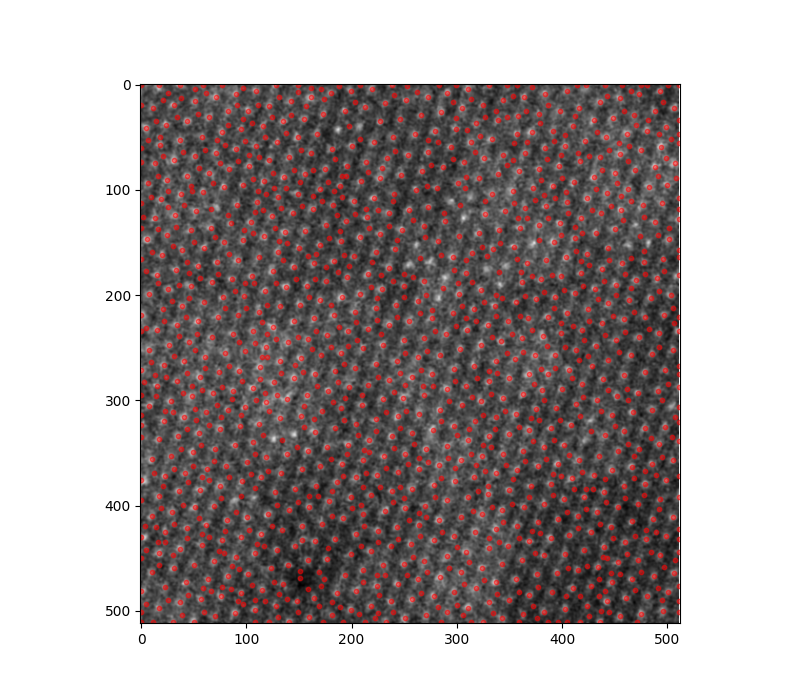

In [6]:
# get atoms
blurred = gaussian_filter(img, sigma=1)
blobs = blob_log(blurred, max_sigma=10, min_sigma=3, threshold=0.2)

fig, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
ax.imshow(blurred.T, cmap='gray')
ax.scatter(blobs[:, 0], blobs[:, 1], c='r', s=10, alpha = .5)

In [7]:
# refine atoms
atom_radius = 3  # in pixel
sym = atom_refine(img, blobs, atom_radius, max_int = 0, min_int = 0, max_dist = 2)
refined_atoms = np.array(sym['atoms'])
intensities = np.array(sym['intensity_area'])

to_delete = np.where(intensities < 0)
refined_atoms = np.delete(refined_atoms, to_delete, axis=0)
intensities = np.delete(intensities, to_delete, axis=0)

/Users/austin/Documents/GitHub/asyncroscopy/.venv/lib/python3.12/site-packages/pyTEMlib/atom_tools.py:181: RuntimeWarning: Number of calls to function has reached maxfev = 1000.
  [pout, _] = scipy.optimize.leastsq(gauss_difference, guess, args=area)


(array([  4.,  73., 247., 230.,  83., 192., 288., 146.,  43.,  12.]),
 array([ 51352. ,  59505.5,  67659. ,  75812.5,  83966. ,  92119.5,
        100273. , 108426.5, 116580. , 124733.5, 132887. ]),
 <BarContainer object of 10 artists>)

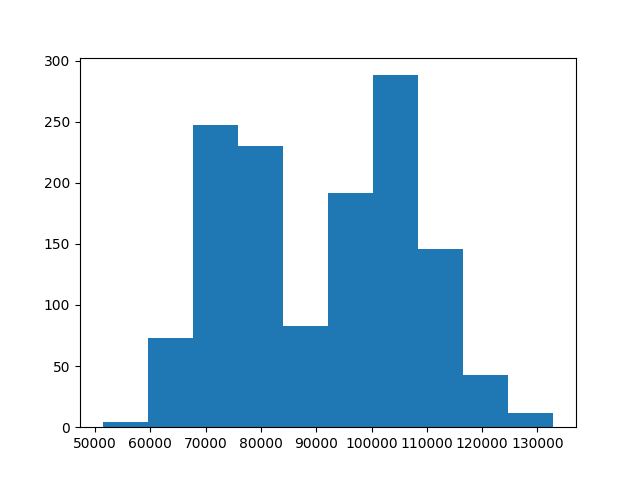

In [8]:
plt.figure()
plt.hist(intensities.ravel())


In [23]:
cutoff = 90e3
metal_atoms = refined_atoms[intensities > cutoff]
chalcogen_atoms = refined_atoms[intensities <= cutoff]

# randomly select metal atoms
edge_margin = 60      # pixels from image edge
min_separation = 60   # minimum distance between targets (pixels)
n_targets = 10

h, w = img.shape
x = metal_atoms[:, 0]
y = metal_atoms[:, 1]
interior_mask = ((x > edge_margin) & (x < w - edge_margin) & (y > edge_margin) & (y < h - edge_margin))
candidates = metal_atoms[interior_mask]
def select_separated(points, n, min_dist):
    selected = []
    idx = np.random.permutation(len(points))
    for i in idx:
        p = points[i]
        if all(np.linalg.norm(p - q) >= min_dist for q in selected):
            selected.append(p)
        if len(selected) == n:
            break
    return np.array(selected)
targets = select_separated(candidates, n=n_targets, min_dist=min_separation)

fig, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
ax.imshow(img.T, cmap='gray', origin='lower')
ax.scatter(metal_atoms[:, 0], metal_atoms[:, 1], c='orange', s=10, alpha = .5, label='Metal atoms')
ax.scatter(chalcogen_atoms[:, 0], chalcogen_atoms[:, 1], c='g', s=10, alpha = .5, label='Chalcogen atoms')
ax.scatter(targets[:, 0], targets[:, 1], c='r', s=30, alpha = .8, label='Target atoms')

IndexError: boolean index did not match indexed array along axis 0; size of axis is 1318 but size of corresponding boolean axis is 10

Frame 1/5
Frame 2/5
Frame 3/5
Frame 4/5
Frame 5/5


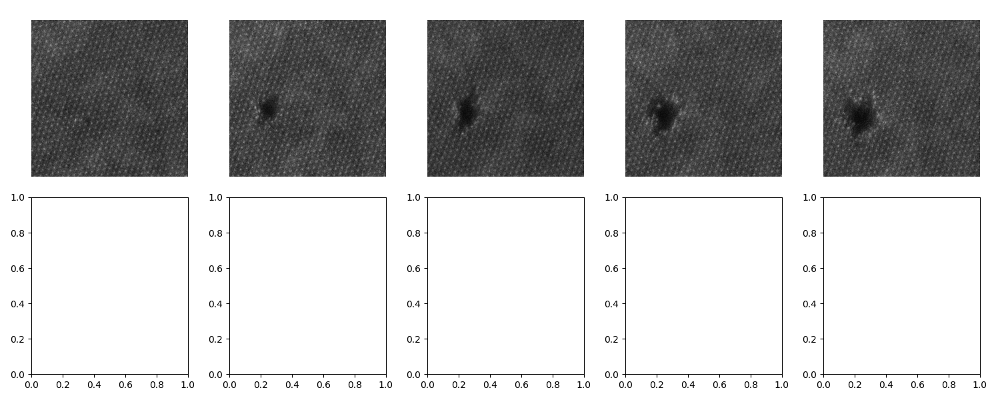

In [24]:
# =========================
# Experiment parameters
# =========================
n_frames = 5
blast_duration = 10e-2      # s
blast_current = 200    # pA
imaging_current = 50     # pA

img_h, img_w = img.shape
n_targets = len(targets)

beam_positions = np.column_stack([
    targets[:, 1] / img_w,
    targets[:, 0] / img_h,
])

# Track which targets are still alive
active = np.ones(n_targets, dtype=bool)

# Storage
intensities_over_time = np.full((n_frames, n_targets), np.nan)

# =========================
# Run experiment
# =========================
fig, ax = plt.subplots(2,5, figsize=(15, 6))
ax = ax.flatten()

for frame in range(n_frames):
    print(f"Frame {frame+1}/{n_frames}")

    # ---------------------
    # Blast active targets
    # ---------------------
    tem.send_command('AS', 'set_current', {'current': blast_current})
    time.sleep(1)
    for (bx, by), is_active in zip(beam_positions, active):
        if not is_active:
            continue
        tem.send_command('AS', 'place_beam', {'x': bx, 'y': by})
        tem.send_command('AS', 'unblank_beam', {'duration': blast_duration})

    # ---------------------
    # Image
    # ---------------------
    tem.send_command('AS', 'set_current', {'current': imaging_current})
    time.sleep(1)
    img = tem.send_command('AS', 'get_scanned_image', image_args)

    ax[frame].imshow(img.T, cmap='gray')
    ax[frame].axis('off')

    # ---------------------
    # Atom refinement
    # ---------------------
    sym = atom_refine(
        img,
        targets,
        atom_radius,
        max_int=0,
        min_int=0,
        max_dist=2
    )

    intensities = np.array(sym['intensity_area'])
    intensities_over_time[frame] = intensities

    # ---------------------
    # Adaptive shutoff
    # ---------------------
    if frame == 0:
        reference_intensity = intensities.copy()

    drop = intensities < 0.3 * reference_intensity
    active &= ~drop

fig.tight_layout()

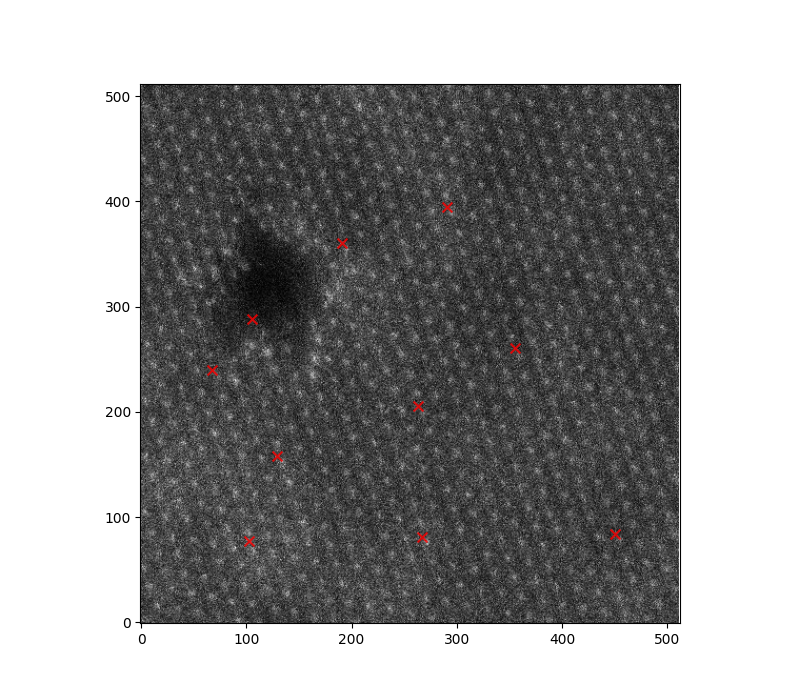

In [25]:
fig, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
ax.imshow(img.T, cmap='gray', origin='lower')
ax.scatter(targets[:, 0], targets[:, 1], c='r', s=50, alpha = .8, label='Target atoms', marker='x')

In [26]:
I = intensities_over_time.copy()
I[I <= 0] = np.nan

# Per-target max and its frame
Imax = np.nanmax(I, axis=0)
t_max = np.nanargmax(I, axis=0)

# 70% threshold
threshold = 0.7 * Imax

# Frame indices
frames = np.arange(I.shape[0])[:, None]

# Condition: below 70% *after* reaching max
below_after_peak = (I < threshold) & (frames > t_max)

# First frame where this happens
first_drop = np.argmax(below_after_peak, axis=0)

# Handle atoms that never drop below threshold
never_dropped = ~np.any(below_after_peak, axis=0)

ejection_frame = first_drop.astype(float)
ejection_frame[never_dropped] = np.nan

Text(0.5, 1.0, 'Target atom intensity vs irradiation frame')

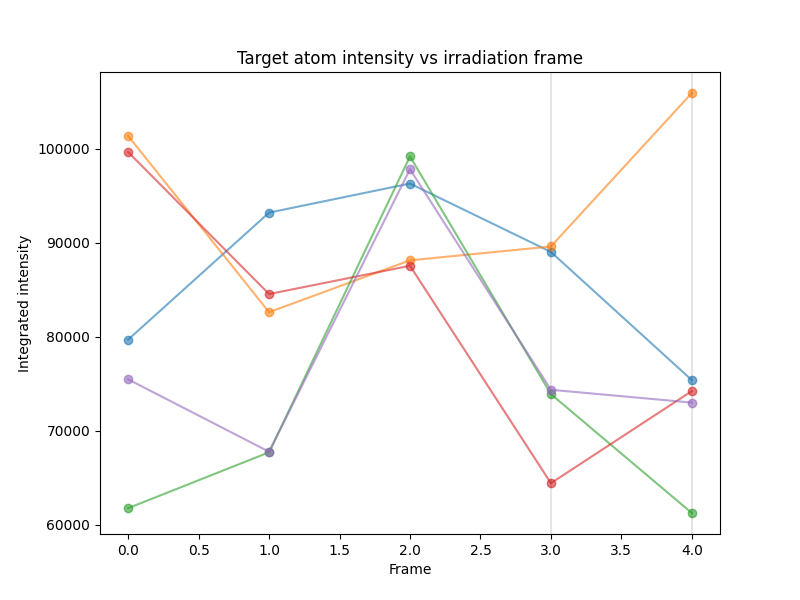

In [27]:
plt.figure(figsize=(8,6))

for i in range(5):
    plt.plot(intensities_over_time[:, i], '-o', alpha=0.6)
    if not np.isnan(ejection_frame[i]):
        plt.axvline(ejection_frame[i], color='k', alpha=0.1)

plt.xlabel("Frame")
plt.ylabel("Integrated intensity")
plt.title("Target atom intensity vs irradiation frame")
# plt.grid(True)

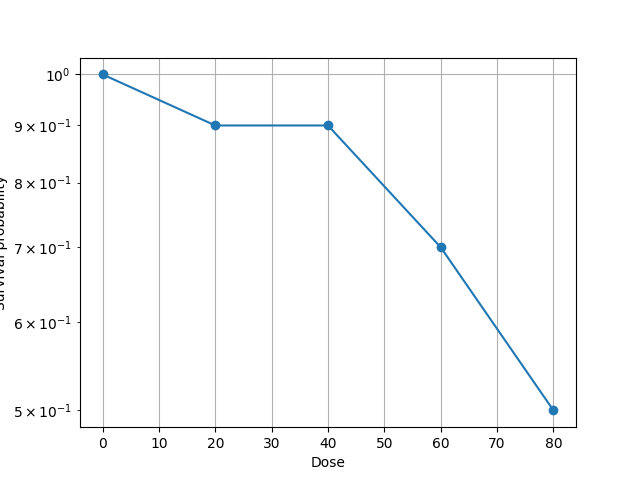

In [28]:
dose_per_frame = blast_current * blast_duration
dose = dose_per_frame * np.arange(n_frames)

alive = np.isnan(ejection_frame)[None, :] | (
    np.arange(n_frames)[:, None] < ejection_frame[None, :]
)

survival = np.mean(alive, axis=1)

plt.figure()
plt.semilogy(dose, survival, '-o')
plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.grid(True)

sigma = 2.886e-03
A     = 3.371e-08
alpha = 3.75


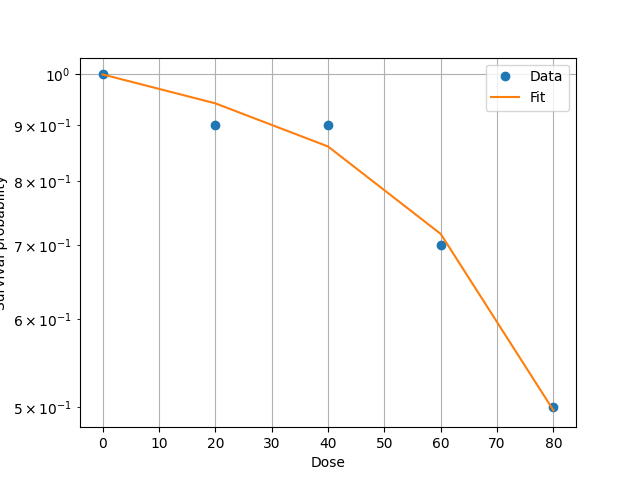

In [29]:
from scipy.optimize import curve_fit

def survival_model(D, sigma, A, alpha):
    return np.exp(-(sigma * D + A * D**alpha))

mask = dose > 0

p0 = (1e-7, 1e-9, 2.0)

popt, pcov = curve_fit(
    survival_model,
    dose[mask],
    survival[mask],
    p0=p0,
    bounds=([0, 0, 1], [np.inf, np.inf, 5])
)

sigma_fit, A_fit, alpha_fit = popt

print(f"sigma = {sigma_fit:.3e}")
print(f"A     = {A_fit:.3e}")
print(f"alpha = {alpha_fit:.2f}")

plt.figure()
plt.semilogy(dose, survival, 'o', label='Data')
plt.semilogy(dose, survival_model(dose, *popt), '-', label='Fit')
plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.legend()
plt.grid(True)

In [66]:
# dose_map = tem.send_command('AS', 'get_dose_map', {})
# plt.figure()
# plt.imshow(dose_map.T, cmap=parula_color_map, origin='lower')
# plt.axis('off')
# plt.colorbar()

### Batchwise

In [163]:
# =========================
# Experiment configuration
# =========================
n_batches = 20
n_frames = 20

blast_duration = 1      # s
blast_current = 25      # pA
imaging_current = 1     # pA

dose_per_frame = blast_current * blast_duration

img_h, img_w = img.shape
n_targets = len(targets)

beam_positions = np.column_stack([
    targets[:, 1] / img_w,
    targets[:, 0] / img_h,
])

# Storage: (batch, frame, target)
intensity_batches = np.full(
    (n_batches, n_frames, n_targets),
    np.nan
)

# =========================
# Run batches
# =========================
for b in range(n_batches):
    print(f"\n===== Batch {b+1}/{n_batches} =====")

    # Reset sample
    tem.send_command('AS', 'load_sample')

    active = np.ones(n_targets, dtype=bool)
    reference_intensity = None

    for frame in range(n_frames):
        print(f"  Frame {frame+1}/{n_frames}")

        # ---------------------
        # Blast active targets
        # ---------------------
        tem.send_command('AS', 'set_beam_current', {'current': blast_current})

        for (bx, by), is_active in zip(beam_positions, active):
            if not is_active:
                continue
            tem.send_command('AS', 'place_beam', {'x': bx, 'y': by})
            tem.send_command('AS', 'unblank_beam', {'duration': blast_duration})

        # ---------------------
        # Image
        # ---------------------
        tem.send_command('AS', 'set_beam_current', {'current': imaging_current})
        img = tem.send_command('AS', 'get_scanned_image', image_args)

        # ---------------------
        # Atom refinement
        # ---------------------
        sym = atom_refine(
            img,
            targets,
            atom_radius,
            max_int=0,
            min_int=0,
            max_dist=2
        )

        intensities = np.array(sym['intensity_area'])
        intensity_batches[b, frame] = intensities

        # ---------------------
        # Adaptive shutoff
        # ---------------------
        if frame == 0:
            reference_intensity = intensities.copy()

        dropped = intensities < 0.3 * reference_intensity
        active &= ~dropped


===== Batch 1/20 =====
  Frame 1/20


/Users/austin/Documents/GitHub/asyncroscopy/.venv/lib/python3.12/site-packages/pyTEMlib/atom_tools.py:181: RuntimeWarning: Number of calls to function has reached maxfev = 1000.
  [pout, _] = scipy.optimize.leastsq(gauss_difference, guess, args=area)


  Frame 2/20
  Frame 3/20
  Frame 4/20
  Frame 5/20
  Frame 6/20
  Frame 7/20
  Frame 8/20
  Frame 9/20
  Frame 10/20
  Frame 11/20
  Frame 12/20
  Frame 13/20
  Frame 14/20
  Frame 15/20
  Frame 16/20
  Frame 17/20
  Frame 18/20
  Frame 19/20
  Frame 20/20

===== Batch 2/20 =====
  Frame 1/20
  Frame 2/20
  Frame 3/20
  Frame 4/20
  Frame 5/20
  Frame 6/20
  Frame 7/20
  Frame 8/20
  Frame 9/20
  Frame 10/20
  Frame 11/20
  Frame 12/20
  Frame 13/20
  Frame 14/20
  Frame 15/20
  Frame 16/20
  Frame 17/20
  Frame 18/20
  Frame 19/20
  Frame 20/20

===== Batch 3/20 =====
  Frame 1/20
  Frame 2/20
  Frame 3/20
  Frame 4/20
  Frame 5/20
  Frame 6/20
  Frame 7/20
  Frame 8/20
  Frame 9/20
  Frame 10/20
  Frame 11/20
  Frame 12/20
  Frame 13/20
  Frame 14/20
  Frame 15/20
  Frame 16/20
  Frame 17/20
  Frame 18/20
  Frame 19/20
  Frame 20/20

===== Batch 4/20 =====
  Frame 1/20
  Frame 2/20
  Frame 3/20
  Frame 4/20
  Frame 5/20
  Frame 6/20
  Frame 7/20
  Frame 8/20
  Frame 9/20
  Frame 10/

In [164]:
np.savez(
    "multi_batch_survival_W.npz",
    intensity_batches=intensity_batches,
    dose_per_frame=dose_per_frame,
    blast_current=blast_current,
    blast_duration=blast_duration
)

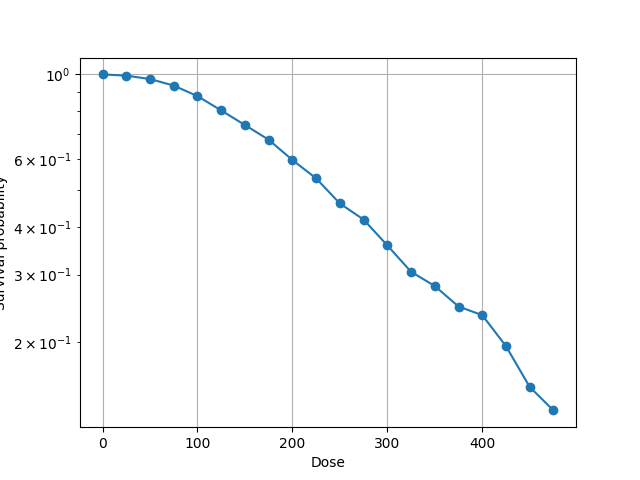

In [166]:
B, F, T = intensity_batches.shape

ejection_frames = np.full((B, T), np.nan)

for b in range(B):
    I = intensity_batches[b].copy()
    I[I <= 0] = np.nan

    logI = np.log(I)
    dlogI = np.diff(logI, axis=0)

    for i in range(T):
        drops = np.where(dlogI[:, i] < -1.0)[0]
        if len(drops):
            ejection_frames[b, i] = drops[0] + 1


frames = np.arange(F)
dose = frames * dose_per_frame

alive = np.isnan(ejection_frames)[:, None, :] | (
    frames[None, :, None] < ejection_frames[:, None, :]
)

# average over batches and targets
survival = alive.mean(axis=(0, 2))

plt.figure()
plt.semilogy(dose, survival, '-o')
plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.grid(True)

sigma = 6.687e-20
A     = 7.234e-05
alpha = 1.67


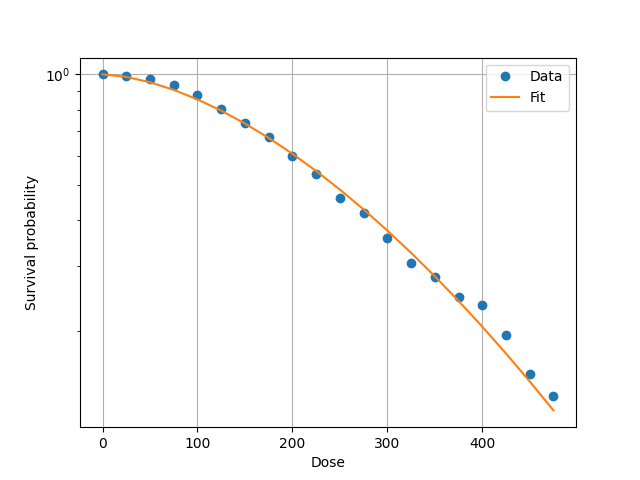

In [167]:
from scipy.optimize import curve_fit

def survival_model(D, sigma, A, alpha):
    return np.exp(-(sigma * D + A * D**alpha))

mask = dose > 0

p0 = (1e-7, 1e-9, 2.0)

popt, pcov = curve_fit(
    survival_model,
    dose[mask],
    survival[mask],
    p0=p0,
    bounds=([0, 0, 1], [np.inf, np.inf, 5])
)

sigma_fit, A_fit, alpha_fit = popt

print(f"sigma = {sigma_fit:.3e}")
print(f"A     = {A_fit:.3e}")
print(f"alpha = {alpha_fit:.2f}")

plt.figure()
plt.semilogy(dose, survival, 'o', label='Data')
plt.semilogy(dose, survival_model(dose, *popt), '-', label='Fit')
plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.legend()
plt.grid(True)
# For W

### now for S atoms

In [214]:
tem.send_command('AS', 'load_sample')

'Loaded sample with 3600 atoms. Dose map initialized.'

'Current atom count: 3600'

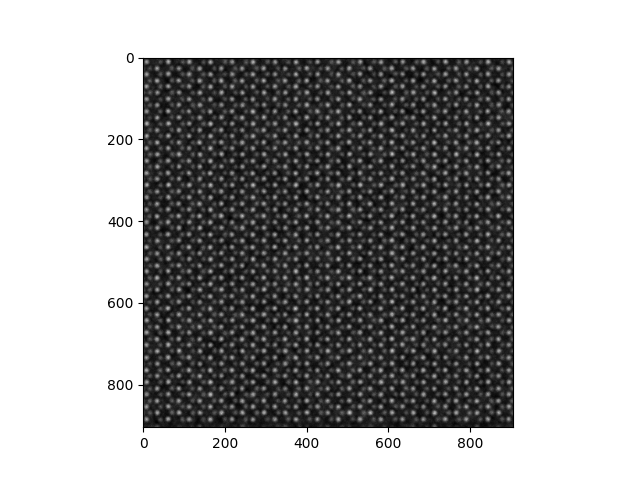

In [215]:
image_args = {'scanning_detector':'HAADF',
                'size':512,
                'dwell_time':10e-6}

beam_current = 1
tem.send_command('AS', 'set_beam_current', {'current':beam_current}) # pA
img = tem.send_command('AS','get_scanned_image', image_args)

plt.figure()
plt.imshow(img, cmap="gray")
tem.send_command('AS', 'get_atom_count', {})

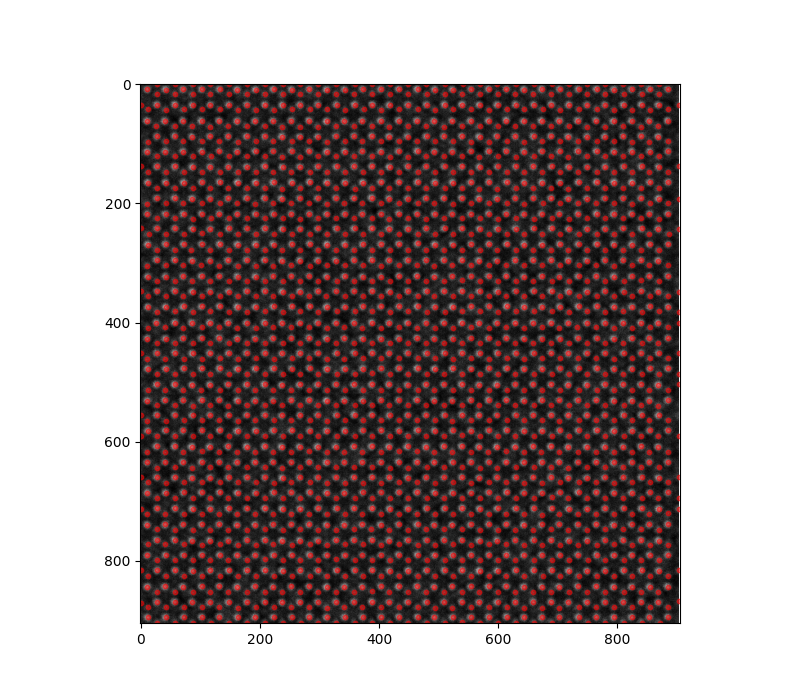

In [216]:
# get atoms
blurred = gaussian_filter(img, sigma=1)
blobs = blob_log(blurred, max_sigma=3, threshold=0.05)

fig, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
ax.imshow(img.T, cmap='gray')
ax.scatter(blobs[:, 0], blobs[:, 1], c='r', s=10, alpha = .5)

In [217]:
# refine atoms
atom_radius = 3  # in pixel
sym = atom_refine(img, blobs, atom_radius, max_int = 0, min_int = 0, max_dist = 2)
refined_atoms = np.array(sym['atoms'])
intensities = np.array(sym['intensity_area'])

to_delete = np.where(intensities < 0)
refined_atoms = np.delete(refined_atoms, to_delete, axis=0)
intensities = np.delete(intensities, to_delete, axis=0)

/Users/austin/Documents/GitHub/asyncroscopy/.venv/lib/python3.12/site-packages/pyTEMlib/atom_tools.py:181: RuntimeWarning: Number of calls to function has reached maxfev = 1000.
  [pout, _] = scipy.optimize.leastsq(gauss_difference, guess, args=area)


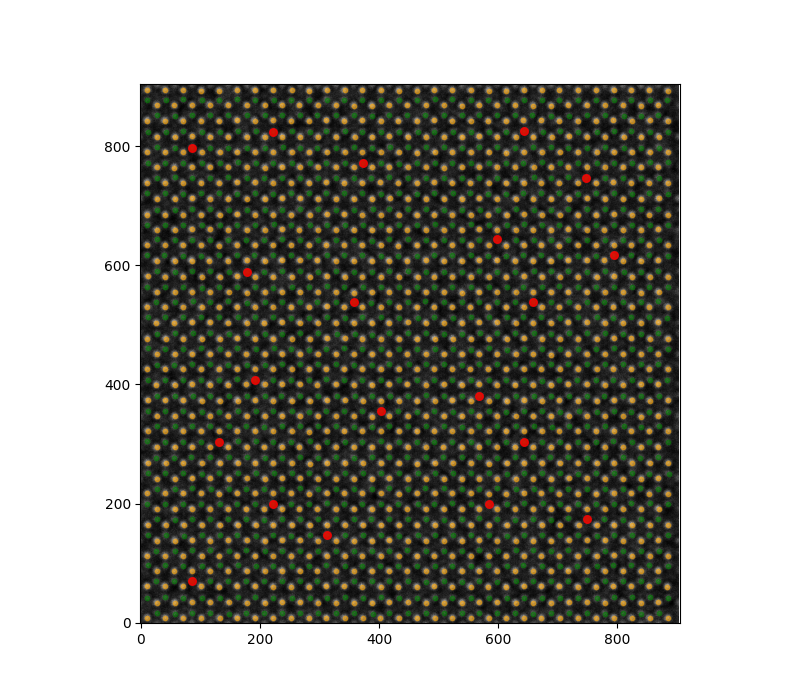

In [218]:
cutoff = 11
metal_atoms = refined_atoms[intensities > cutoff]
chalcogen_atoms = refined_atoms[intensities <= cutoff]

# randomly select metal atoms
edge_margin = 60      # pixels from image edge
min_separation = 100   # minimum distance between targets (pixels)
n_targets = 20

h, w = img.shape
x = chalcogen_atoms[:, 0]
y = chalcogen_atoms[:, 1]
interior_mask = ((x > edge_margin) & (x < w - edge_margin) & (y > edge_margin) & (y < h - edge_margin))
candidates = chalcogen_atoms[interior_mask]
def select_separated(points, n, min_dist):
    selected = []
    idx = np.random.permutation(len(points))
    for i in idx:
        p = points[i]
        if all(np.linalg.norm(p - q) >= min_dist for q in selected):
            selected.append(p)
        if len(selected) == n:
            break
    return np.array(selected)
targets = select_separated(candidates, n=n_targets, min_dist=min_separation)

fig, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
ax.imshow(img.T, cmap='gray', origin='lower')
ax.scatter(metal_atoms[:, 0], metal_atoms[:, 1], c='orange', s=10, alpha = .5, label='Metal atoms')
ax.scatter(chalcogen_atoms[:, 0], chalcogen_atoms[:, 1], c='g', s=10, alpha = .5, label='Chalcogen atoms')
ax.scatter(targets[:, 0], targets[:, 1], c='r', s=30, alpha = .8, label='Target atoms')

Frame 1/20
Frame 2/20
Frame 3/20
Frame 4/20
Frame 5/20
Frame 6/20
Frame 7/20
Frame 8/20
Frame 9/20
Frame 10/20
Frame 11/20
Frame 12/20
Frame 13/20
Frame 14/20
Frame 15/20
Frame 16/20
Frame 17/20
Frame 18/20
Frame 19/20
Frame 20/20


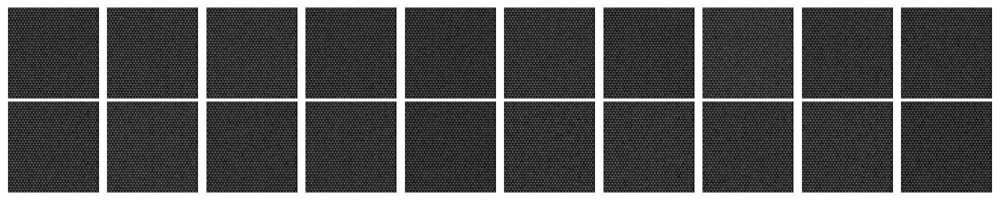

In [219]:
# =========================
# Experiment parameters
# =========================
n_frames = 20
blast_duration = 0.1      # s
blast_current = 1      # pA
imaging_current = 1     # pA

img_h, img_w = img.shape
n_targets = len(targets)

beam_positions = np.column_stack([
    targets[:, 1] / img_w,
    targets[:, 0] / img_h,
])

# Track which targets are still alive
active = np.ones(n_targets, dtype=bool)

# Storage
intensities_over_time = np.full((n_frames, n_targets), np.nan)

# =========================
# Run experiment
# =========================
fig, ax = plt.subplots(2,10, figsize=(20, 4))
ax = ax.flatten()

for frame in range(n_frames):
    print(f"Frame {frame+1}/{n_frames}")

    # ---------------------
    # Blast active targets
    # ---------------------
    tem.send_command('AS', 'set_beam_current', {'current': blast_current})

    for (bx, by), is_active in zip(beam_positions, active):
        if not is_active:
            continue
        tem.send_command('AS', 'place_beam', {'x': bx, 'y': by})
        tem.send_command('AS', 'unblank_beam', {'duration': blast_duration})

    # ---------------------
    # Image
    # ---------------------
    tem.send_command('AS', 'set_beam_current', {'current': imaging_current})
    img = tem.send_command('AS', 'get_scanned_image', image_args)

    ax[frame].imshow(img.T, cmap='gray')
    ax[frame].axis('off')

    # ---------------------
    # Atom refinement
    # ---------------------
    sym = atom_refine(
        img,
        targets,
        atom_radius,
        max_int=0,
        min_int=0,
        max_dist=2
    )

    intensities = np.array(sym['intensity_area'])
    intensities_over_time[frame] = intensities

    # ---------------------
    # Adaptive shutoff
    # ---------------------
    if frame == 0:
        reference_intensity = intensities.copy()

    drop = intensities < 0.3 * reference_intensity
    active &= ~drop

fig.tight_layout()

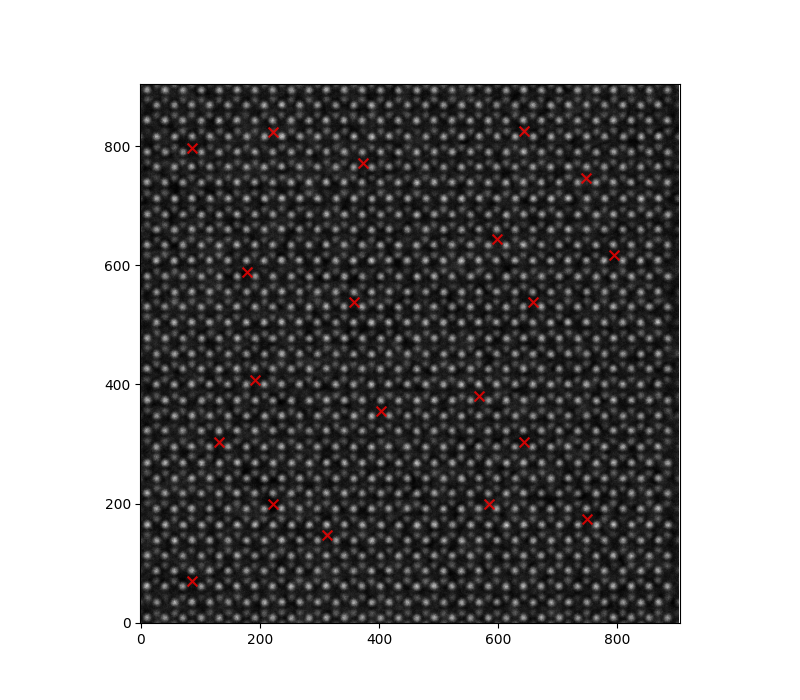

In [220]:
fig, ax = plt.subplots(1, 1,figsize=(8,7), sharex=True, sharey=True)
ax.imshow(img.T, cmap='gray', origin='lower')
ax.scatter(targets[:, 0], targets[:, 1], c='r', s=50, alpha = .8, label='Target atoms', marker='x')

In [258]:
I = intensities_over_time.copy()
I[I <= 0] = np.nan

n_frames, n_targets = I.shape

first_ejection = np.full(n_targets, np.nan)
second_ejection = np.full(n_targets, np.nan)

for i in range(n_targets):
    I0 = I[0, i]
    if not np.isfinite(I0):
        continue

    # First S atom lost (~25% drop)
    f1 = np.where(I[:, i] < 0.7 * I0)[0]
    if len(f1):
        first_ejection[i] = f1[0]

    # Second S atom lost (~50% drop)
    f2 = np.where(I[:, i] < 0.40 * I0)[0]
    if len(f2):
        second_ejection[i] = f2[0]

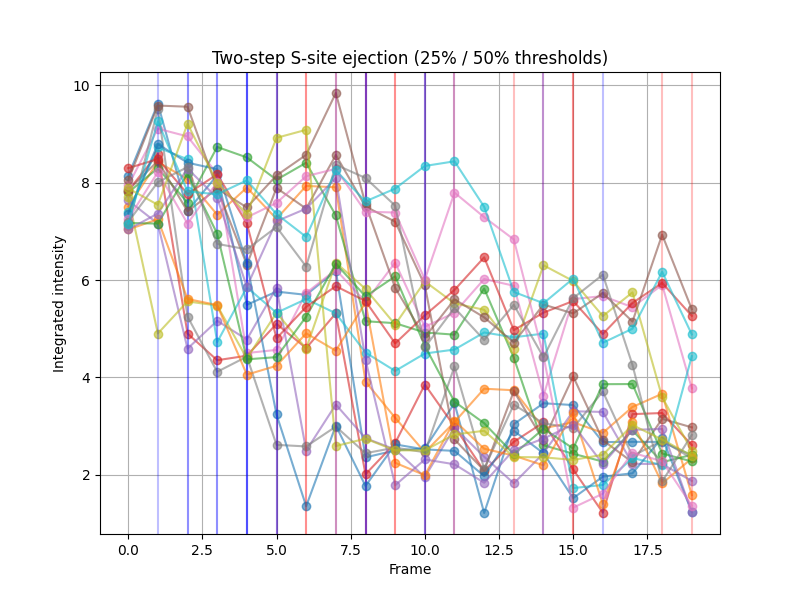

In [259]:
plt.figure(figsize=(8,6))

for i in range(n_targets):
    plt.plot(I[:, i], '-o', alpha=0.6)

    if not np.isnan(first_ejection[i]):
        plt.axvline(first_ejection[i], color='blue', alpha=0.25)

    if not np.isnan(second_ejection[i]):
        plt.axvline(second_ejection[i], color='red', alpha=0.25)

plt.xlabel("Frame")
plt.ylabel("Integrated intensity")
plt.title("Two-step S-site ejection (25% / 50% thresholds)")
plt.grid(True)

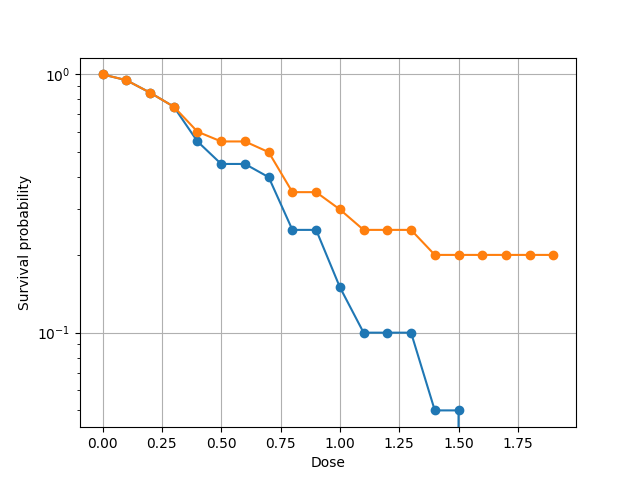

In [271]:
dose_per_frame = blast_current * blast_duration
dose = dose_per_frame * np.arange(n_frames)

alive1 = np.isnan(first_ejection)[None, :] | (np.arange(n_frames)[:, None] < first_ejection[None, :])
survival1 = np.mean(alive1, axis=1)

alive2 = np.isnan(second_ejection)[None, :] | (np.arange(n_frames)[:, None] < first_ejection[None, :])
survival2 = np.mean(alive2, axis=1)


plt.figure()
plt.semilogy(dose, survival1, '-o')
plt.semilogy(dose, survival2, '-o')
plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.grid(True)

sigma = 4.416e-17
A     = 1.802e+00
alpha = 1.42


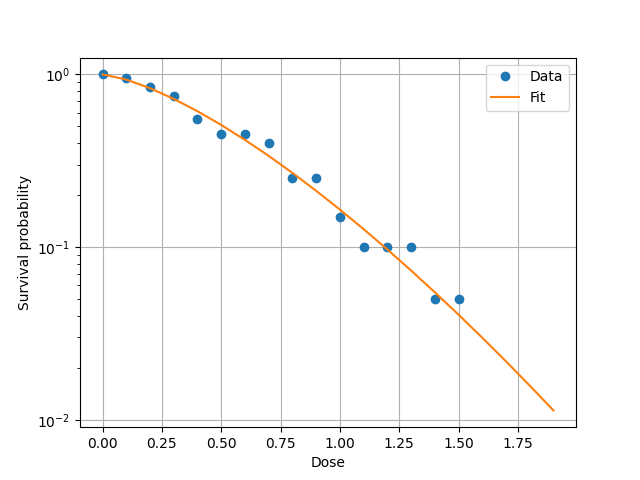

In [272]:
from scipy.optimize import curve_fit

def survival_model(D, sigma, A, alpha):
    return np.exp(-(sigma * D + A * D**alpha))

mask = dose > 0

p0 = (1e-7, 1e-9, 2.0)

popt, pcov = curve_fit(
    survival_model,
    dose[mask],
    survival1[mask],
    p0=p0,
    bounds=([0, 0, 1], [np.inf, np.inf, 5])
)

sigma_fit, A_fit, alpha_fit = popt

print(f"sigma = {sigma_fit:.3e}")
print(f"A     = {A_fit:.3e}")
print(f"alpha = {alpha_fit:.2f}")

plt.figure()
plt.semilogy(dose, survival1, 'o', label='Data')
plt.semilogy(dose, survival_model(dose, *popt), '-', label='Fit')
plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.legend()
plt.grid(True)

In [274]:
# =========================
# Experiment configuration
# =========================
n_batches = 2
n_frames = 20

blast_duration = 0.1      # s
blast_current = 1      # pA
imaging_current = 1     # pA

dose_per_frame = blast_current * blast_duration

img_h, img_w = img.shape
n_targets = len(targets)

beam_positions = np.column_stack([
    targets[:, 1] / img_w,
    targets[:, 0] / img_h,
])

# Storage: (batch, frame, target)
intensity_batches = np.full(
    (n_batches, n_frames, n_targets),
    np.nan
)

# =========================
# Run batches
# =========================
for b in range(n_batches):
    print(f"\n===== Batch {b+1}/{n_batches} =====")

    # Reset sample
    tem.send_command('AS', 'load_sample')

    active = np.ones(n_targets, dtype=bool)
    reference_intensity = None

    for frame in range(n_frames):
        print(f"  Frame {frame+1}/{n_frames}")

        # ---------------------
        # Blast active targets
        # ---------------------
        tem.send_command('AS', 'set_beam_current', {'current': blast_current})

        for (bx, by), is_active in zip(beam_positions, active):
            if not is_active:
                continue
            tem.send_command('AS', 'place_beam', {'x': bx, 'y': by})
            tem.send_command('AS', 'unblank_beam', {'duration': blast_duration})

        # ---------------------
        # Image
        # ---------------------
        tem.send_command('AS', 'set_beam_current', {'current': imaging_current})
        img = tem.send_command('AS', 'get_scanned_image', image_args)

        # ---------------------
        # Atom refinement
        # ---------------------
        sym = atom_refine(
            img,
            targets,
            atom_radius,
            max_int=0,
            min_int=0,
            max_dist=2
        )

        intensities = np.array(sym['intensity_area'])
        intensity_batches[b, frame] = intensities

        # ---------------------
        # Adaptive shutoff
        # ---------------------
        if frame == 0:
            reference_intensity = intensities.copy()

        dropped = intensities < 0.1 * reference_intensity
        active &= ~dropped


===== Batch 1/20 =====
  Frame 1/20
  Frame 2/20
  Frame 3/20
  Frame 4/20
  Frame 5/20
  Frame 6/20
  Frame 7/20
  Frame 8/20
  Frame 9/20


/Users/austin/Documents/GitHub/asyncroscopy/.venv/lib/python3.12/site-packages/pyTEMlib/atom_tools.py:181: RuntimeWarning: Number of calls to function has reached maxfev = 1000.
  [pout, _] = scipy.optimize.leastsq(gauss_difference, guess, args=area)


  Frame 10/20
  Frame 11/20
  Frame 12/20
  Frame 13/20
  Frame 14/20
  Frame 15/20
  Frame 16/20
  Frame 17/20
  Frame 18/20
  Frame 19/20
  Frame 20/20

===== Batch 2/20 =====
  Frame 1/20
  Frame 2/20
  Frame 3/20
  Frame 4/20
  Frame 5/20
  Frame 6/20
  Frame 7/20
  Frame 8/20
  Frame 9/20
  Frame 10/20
  Frame 11/20
  Frame 12/20
  Frame 13/20
  Frame 14/20
  Frame 15/20
  Frame 16/20
  Frame 17/20
  Frame 18/20
  Frame 19/20
  Frame 20/20

===== Batch 3/20 =====
  Frame 1/20
  Frame 2/20
  Frame 3/20
  Frame 4/20
  Frame 5/20
  Frame 6/20
  Frame 7/20
  Frame 8/20
  Frame 9/20
  Frame 10/20
  Frame 11/20
  Frame 12/20
  Frame 13/20
  Frame 14/20
  Frame 15/20
  Frame 16/20
  Frame 17/20
  Frame 18/20
  Frame 19/20
  Frame 20/20

===== Batch 4/20 =====
  Frame 1/20
  Frame 2/20
  Frame 3/20
  Frame 4/20
  Frame 5/20
  Frame 6/20
  Frame 7/20
  Frame 8/20
  Frame 9/20
  Frame 10/20
  Frame 11/20
  Frame 12/20
  Frame 13/20
  Frame 14/20
  Frame 15/20
  Frame 16/20
  Frame 17/20
  F

In [275]:
np.savez(
    "multi_batch_survival_S.npz",
    intensity_batches=intensity_batches,
    dose_per_frame=dose_per_frame,
    blast_current=blast_current,
    blast_duration=blast_duration
)

In [280]:
alive_first.shape

(20, 1, 20)

In [282]:
first_drop_frames

array([[ 6., 10.,  5.,  3.,  8.,  6.,  7.,  8.,  5., 12.,  4., 11.,  5.,
         1.,  8., 13.,  9.,  6.,  5.,  4.],
       [ 4.,  2.,  9.,  7.,  5.,  6.,  7.,  7., 11.,  3.,  4., nan,  4.,
         9.,  9.,  5.,  4.,  6.,  3.,  6.],
       [ 2.,  9.,  3.,  3., 11.,  5.,  5.,  4.,  5., 12., 10., 10., 13.,
         3.,  8., 13.,  6.,  6.,  6., 10.],
       [ 6.,  6.,  3.,  4.,  6.,  6.,  1.,  7., 12.,  5.,  5.,  5.,  8.,
         3.,  4.,  4.,  3., 10.,  6., 10.],
       [ 4.,  8.,  6., 16.,  7.,  1.,  6.,  1.,  1.,  2.,  7., 10.,  9.,
         4.,  4.,  3.,  4.,  9., 10.,  6.],
       [ 4.,  9.,  5.,  3.,  4.,  4.,  2., 10.,  7.,  3.,  9.,  6.,  4.,
         3.,  4.,  4.,  8., 10.,  3.,  4.],
       [ 8., 14.,  2.,  6.,  4., 14.,  8.,  4.,  9., nan,  5.,  5.,  8.,
         7.,  7.,  5.,  8.,  6., 11.,  7.],
       [ 1.,  3.,  7.,  7.,  6.,  5.,  6.,  7.,  3.,  6.,  3.,  4.,  4.,
         3.,  9.,  8., 10.,  6.,  7., 11.],
       [ 8., 14.,  7.,  7.,  6.,  3.,  7.,  5.,  8.,  7.,  4.,  

In [285]:
second_drop_frames.shape

(20, 20)

In [294]:
survival_first[0]

array([0.25, 0.45, 0.2 , 0.25, 0.3 , 0.25, 0.25, 0.25, 0.4 , 0.3 , 0.3 ,
       0.4 , 0.35, 0.3 , 0.3 , 0.3 , 0.35, 0.4 , 0.3 , 0.45])

In [291]:
first_drop_frames.shape

(20, 20)

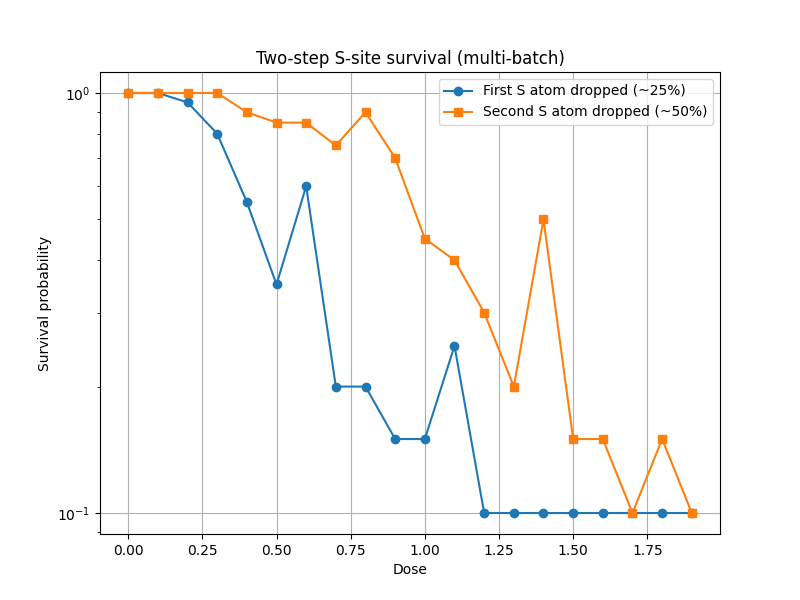

In [314]:
B, F, T = intensity_batches.shape

# Storage for first and second drop frames
first_drop_frames = np.full((B, T), np.nan)
second_drop_frames = np.full((B, T), np.nan)

for b in range(B):
    I = intensity_batches[b].copy()
    I[I <= 0] = np.nan

    for i in range(T):
        I0 = I[0, i]
        if not np.isfinite(I0):
            continue

        # First drop: intensity < 0.7 * I0
        f1 = np.where(I[:, i] < 0.7 * I0)[0]
        if f1.size > 0:
            first_drop_frames[b, i] = float(f1[0])

        # Second drop: intensity < 0.4 * I0
        f2 = np.where(I[:, i] < 0.4 * I0)[0]
        if f2.size > 0:
            second_drop_frames[b, i] = float(f2[0])

            
frames = np.arange(F)
dose = frames * dose_per_frame

alive_first = np.isnan(first_drop_frames)[:, None, :] | (frames[:, None, None] < first_drop_frames[:, None, :])
survival_first = alive_first.mean(axis=(2)).flatten()

alive_second = np.isnan(second_drop_frames)[:, None, :] | (frames[:, None, None] < second_drop_frames[:, None, :])
survival_second = alive_second.mean(axis=(2)).flatten()  # <--- flatten ensures 1D

eps = 1e-1  # small positive number
survival_first_clipped = np.clip(survival_first, eps, 1.0)
survival_second_clipped = np.clip(survival_second, eps, 1.0)
# survival_first_clipped[survival_first_clipped==eps] = np.nan
# =========================
# Plot survival curves
# =========================
plt.figure(figsize=(8,6))
plt.semilogy(dose, survival_first_clipped, '-o', label='First S atom dropped (~25%)')
plt.semilogy(dose, survival_second_clipped, '-s', label='Second S atom dropped (~50%)')
plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.title("Two-step S-site survival (multi-batch)")
plt.legend()
plt.grid(True)

sigma = 4.416e-17
A     = 1.802e+00
alpha = 1.42


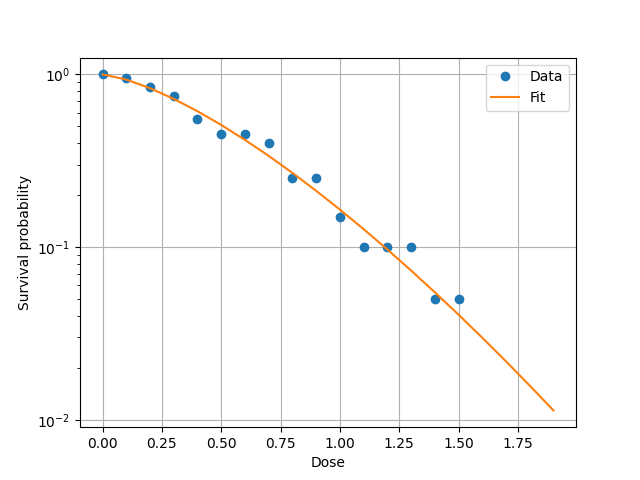

In [315]:
from scipy.optimize import curve_fit

def survival_model(D, sigma, A, alpha):
    return np.exp(-(sigma * D + A * D**alpha))

mask = dose > 0

p0 = (1e-7, 1e-9, 2.0)

popt, pcov = curve_fit(
    survival_model,
    dose[mask],
    survival[mask],
    p0=p0,
    bounds=([0, 0, 1], [np.inf, np.inf, 5])
)

sigma_fit, A_fit, alpha_fit = popt

print(f"sigma = {sigma_fit:.3e}")
print(f"A     = {A_fit:.3e}")
print(f"alpha = {alpha_fit:.2f}")

plt.figure()
plt.semilogy(dose, survival, 'o', label='Data')
plt.semilogy(dose, survival_model(dose, *popt), '-', label='Fit')
plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.legend()
plt.grid(True)
# For S

First-drop S atom fit:
  sigma  = 1.923e-16
  A      = 2.074e+00
  alpha  = 1.61

Second-drop S atom fit:
  sigma  = 3.368e-21
  A      = 5.983e-01
  alpha  = 2.48


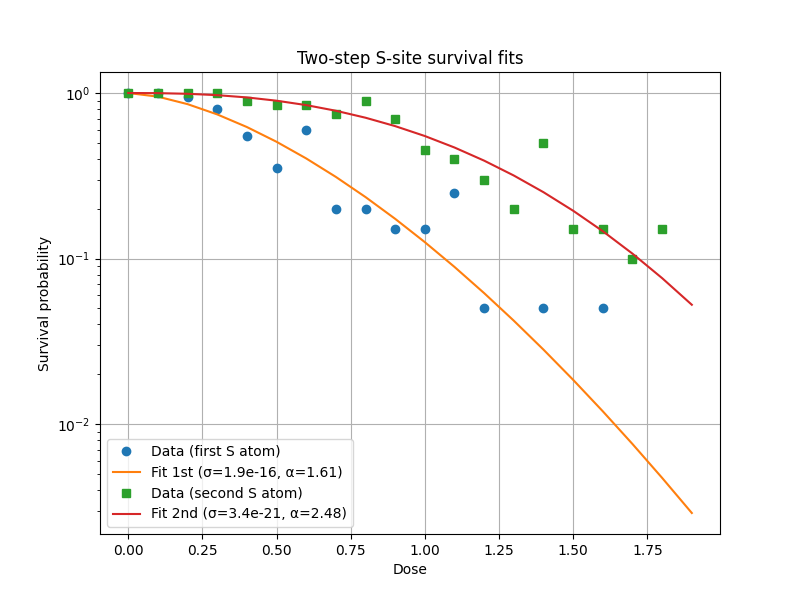

In [316]:
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np

def survival_model(D, sigma, A, alpha):
    return np.exp(-(sigma * D + A * D**alpha))

# Initial guess and bounds
p0 = (1e-7, 1e-9, 2.0)
bounds = ([0, 0, 1], [np.inf, np.inf, 5])

# Only use doses > 0
mask = dose > 0

# -----------------------------
# Fit first-drop survival curve
# -----------------------------
popt1, pcov1 = curve_fit(
    survival_model,
    dose[mask],
    survival_first[mask],
    p0=p0,
    bounds=bounds
)
sigma1, A1, alpha1 = popt1
print(f"First-drop S atom fit:")
print(f"  sigma  = {sigma1:.3e}")
print(f"  A      = {A1:.3e}")
print(f"  alpha  = {alpha1:.2f}")

# -----------------------------
# Fit second-drop survival curve
# -----------------------------
popt2, pcov2 = curve_fit(
    survival_model,
    dose[mask],
    survival_second[mask],
    p0=p0,
    bounds=bounds
)
sigma2, A2, alpha2 = popt2
print(f"\nSecond-drop S atom fit:")
print(f"  sigma  = {sigma2:.3e}")
print(f"  A      = {A2:.3e}")
print(f"  alpha  = {alpha2:.2f}")

# -----------------------------
# Plot data and fits
# -----------------------------
plt.figure(figsize=(8,6))
plt.semilogy(dose, survival_first, 'o', label='Data (first S atom)')
plt.semilogy(dose, survival_model(dose, *popt1), '-', label=f'Fit 1st (σ={sigma1:.1e}, α={alpha1:.2f})')
plt.semilogy(dose, survival_second, 's', label='Data (second S atom)')
plt.semilogy(dose, survival_model(dose, *popt2), '-', label=f'Fit 2nd (σ={sigma2:.1e}, α={alpha2:.2f})')

plt.xlabel("Dose")
plt.ylabel("Survival probability")
plt.title("Two-step S-site survival fits")
plt.legend()
plt.grid(True)